In [1]:
import os

os.environ["XLA_FLAGS"] = "--xla_force_host_platform_device_count=6"
os.environ["PYTENSOR_FLAGS"] = "on_opt_error=ignore"

os.environ["OMP_NUM_THREADS"] = "4"
os.environ["OPENBLAS_NUM_THREADS"] = "4"
os.environ["MKL_NUM_THREADS"] = "4"
os.environ["VECLIB_MAXIMUM_THREADS"] = "4"
os.environ["NUMEXPR_NUM_THREADS"] = "4"

In [2]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import preliz as pz
import pymc as pm

from corner import corner

import gEconpy as ge
import gEconpy.plotting as gp

from gEconpy.model.statespace import data_from_prior

gp.set_matplotlib_style()

In [3]:
RANDOM_SEED = sum(map(ord, "DSGE Estimation"))
rng = np.random.default_rng(RANDOM_SEED)

# Estimating a DSGE Model

To estimate a model, `gEconpy` uses PyMC, specifically the `pymc-extras` statespace module. To do this, you first have to compile a GCN file to a statespace model using `ge.statespace_from_gcn`.

Like `ge.model_from_gcn`, this will show a build report. Unlike `model_from_gcn`, you will not be able to do experiments with the steady state or linearization. Instead, everything is re-oriented towards estimation.

In [4]:
file_path = "../GCN Files/RBC.gcn"
ge.print_gcn_file(file_path)

In [5]:
ss_mod = ge.statespace_from_gcn(file_path, log_linearize=True)

Model Building Complete.
Found:
	9 equations
	9 variables
		The following variables were eliminated at user request:
			TC_t, U_t
		The following "variables" were defined as constants and have been substituted away:
			mc_t
	1 stochastic shock
		 0 / 1 has a defined prior. 
	6 parameters
		 6 / 6 parameters has a defined prior. 
	0 parameters to calibrate.
Model appears well defined and ready to proceed to solving.

Statespace model construction complete, but call the .configure method to finalize.


Unlike `ge.model_from_gcn`, we do not get back a `gEconpy.Model` object. Instead, we get a `DSGEStateSpace` object. This inherits from class:`pymc_extras.statespace.core.PyMCStatespace`, but extended for extra functionality relevant to DSGE modeling.

In [6]:
type(ss_mod)

gEconpy.model.statespace.DSGEStateSpace

You are still able to see the underlying model equations that were parsed from the GCN file. The parser used to create `DSGEStateSpace` is identical to that used for `Model`.

In [7]:
for eq in ss_mod.equations:
    display(eq)

-C_t - I_t + K_t-1*r_t + L_t*w_t

I_t - K_t + K_t-1*(1 - delta)

-lambda_t + C_t**(-sigma_C)

-L_t**sigma_L + lambda_t*w_t

beta*(lambda_t+1*r_t+1 - lambda_t+1*(delta - 1)) - lambda_t

A_t*K_t-1**alpha*L_t**(1 - alpha) - Y_t

alpha*A_t*K_t-1**(alpha - 1)*L_t**(1 - alpha) - r_t

A_t*K_t-1**alpha*(1 - alpha)/L_t**alpha - w_t

rho_A*log(A_t-1) + epsilon_A_t - log(A_t)

Calibrated parameter values are also stored in the `param_dict` property

In [8]:
ss_mod.param_dict

{'alpha': 0.35,
 'beta': 0.99,
 'delta': 0.02,
 'rho_A': 0.95,
 'sigma_C': 1.5,
 'sigma_L': 2.0}

We'll save this list of parameters so we can look at them after estimation

In [9]:
deep_params = list(ss_mod.param_dict.keys())

As are the names of the state variables in the model

In [10]:
ss_mod.state_names

['A', 'C', 'I', 'K', 'L', 'Y', 'lambda', 'r', 'w']

And stochastic shock terms

In [11]:
ss_mod.shock_names

['epsilon_A']

## Choosing Priors

In this GCN file, we have defined priors over all 6 parameters. When priors are defined, they are converted into `preliz` distributions. `preliz` is a package dedicated to prior elicidation. It makes it easy to visualize, play with, and adjust distributions. 

All distributions defined in the CGN file are stored in `ss_mod.param_priors`

In [12]:
ss_mod.param_priors

{'beta': Beta(alpha=70, beta=4),
 'delta': Beta(alpha=2, beta=42),
 'sigma_C': Gamma(alpha=7, beta=3),
 'sigma_L': Gamma(alpha=7, beta=3),
 'alpha': Beta(alpha=2, beta=5),
 'rho_A': Beta(mu=0.95, sigma=0.04)}

These can be visualized by using the `.plot_pdf`, `.plot_cdf`, or `.plot_interactive` methods. These have lots of options for adding different statistics to the plot. In the next cell, we make a plot that shows several of these.

<Axes: >

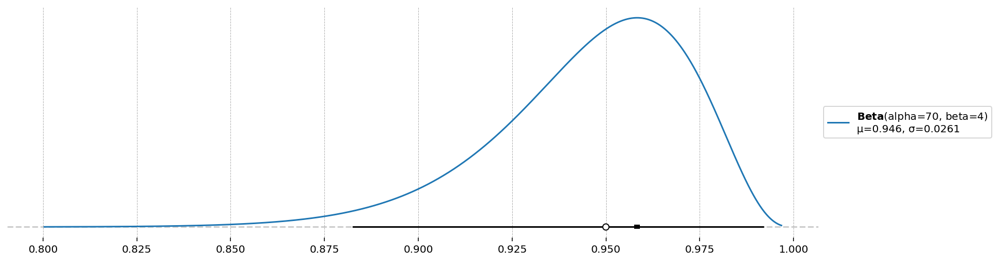

In [13]:
d = ss_mod.param_priors["beta"]
d.plot_pdf(moments="md", pointinterval=True, interval="hdi", levels=(0.025, 0.975))

To plot all priors together, we offer `gEconpy.plotting.plot_priors`. This also drops a veritical line at the calibrated value declared in the GCN file, if any.

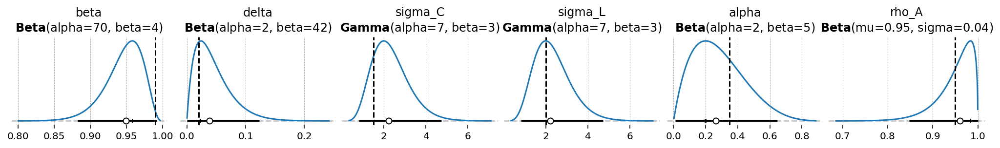

In [14]:
gp.plot_priors(ss_mod);

Declaring priors in a GCN file is totally optional, as is using `preliz`. In the end, you will be able to use any PyMC priors you please, via the `pymc_extras.statespace` API. 


## Configuring the model

To set up a statespace model, you first have to call the `.configure` method. This finalizes model settings, by allowing you to choose:

- `observed_states`: Which states in the DSGE model are observed 
- `measurement_error`: Which observed states have associated measurement error
- `full_shock_covariance`: Whether to estimate a full shock covariance matrix, or just the diagonal elements
- `mode`: Which computational backend to compile the model `logp` function to. See the pytensor documentation for details about the choices. `mode="JAX"` is strongly recommended.
- `solver`: Which algorithm to use for finding the linear policy function. Choices are `gensys`, `cycle_reduction`, or `scan_cycle_reduction`. Only `scan_cycle_reduction` is supported when `mode="JAX"`.
- `use_adjoint_gradients`: Whether to autodiff through the `cycle_reduction` algorithm (`False`), or to directly use an analytical solution (`True`). The analytical solution is recommended.
- `max_iter`: The maximum number of iterations allowed to the `cycle_reduction` algorithm. Because of how looping works in autodiff, loops must always run for the maximum number of iterators. If convregence is detected before the maximum iteration, computation is replaced with the identity function, but it's still not "free". Thus, a low number (10-20), is recommended here to maximimze performance.

Recall that a statespace model can only have as many observed states as there are sources of stochastic variation. Since this model has only one stochastic shock, we will observe only one variable, `Y`.

In [15]:
ss_mod.configure(
    observed_states=["Y"],
    measurement_error=None,
    full_shock_covaraince=False,
    solver="scan_cycle_reduction",
    mode="JAX",
    use_adjoint_gradients=True,
    max_iter=20,
)

                  Model Requirements                  
                                                      
  Variable          Shape   Constraints   Dimensions  
 ──────────────────────────────────────────────────── 
  alpha             ()                          None  
  beta              ()                          None  
  delta             ()                          None  
  rho_A             ()                          None  
  sigma_C           ()      Positive            None  
  sigma_L           ()      Positive            None  
  sigma_epsilon_A   ()      Positive            None  
                                                      
 These parameters should be assigned priors inside a  
         PyMC model block before calling the          
            build_statespace_graph method.            

After calling the `.configure` method, we recieve this Model Requirements table, telling us what needs to be declared inside a `pm.Model` context. This is done exactly like all statespace models, so check the statespace model documentation for more details. 

As noted above, using `preliz` priors is totally optional. Here we define the entire model with `pymc` priors.

To see how the priors look, we can use `pm.sample_prior_predictive`.

In [16]:
with pm.Model(coords=ss_mod.coords) as pm_mod:
    alpha = pm.Beta("alpha", alpha=2, beta=10)
    beta = pm.Beta("beta", alpha=2, beta=30)
    delta = pm.Beta("delta", alpha=1, beta=30)
    rho_A = pm.Beta("rho_A", alpha=10, beta=2)
    sigma_C = pm.TruncatedNormal("sigma_C", mu=1.5, sigma=2, lower=1.01, upper=np.inf)
    sigma_L = pm.TruncatedNormal("sigma_L", mu=1.5, sigma=2, lower=1, upper=np.inf)
    sigma_epsilon_A = pm.Exponential("sigma_epsilon_A", 10)

    priors = pm.sample_prior_predictive(draws=2000, random_seed=rng)

Sampling: [alpha, beta, delta, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


In [17]:
az.summary(priors.prior)

arviz - WARNING - Shape validation failed: input_shape: (1, 2000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_epsilon_A,0.101,0.102,0.000,0.287,0.002,0.002,2246.0,2003.0,NaN
beta,0.061,0.041,0.003,0.139,0.001,0.001,1855.0,1942.0,NaN
alpha,0.166,0.104,0.006,0.350,0.002,0.002,1674.0,1791.0,NaN
delta,0.032,0.031,0.000,0.092,0.001,0.001,1987.0,1919.0,NaN
sigma_L,2.777,1.284,1.004,5.078,0.029,0.020,1927.0,1777.0,NaN
sigma_C,2.807,1.327,1.010,5.182,0.030,0.021,1948.0,2004.0,NaN
rho_A,0.835,0.105,0.639,0.994,0.002,0.002,1974.0,1964.0,NaN


/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


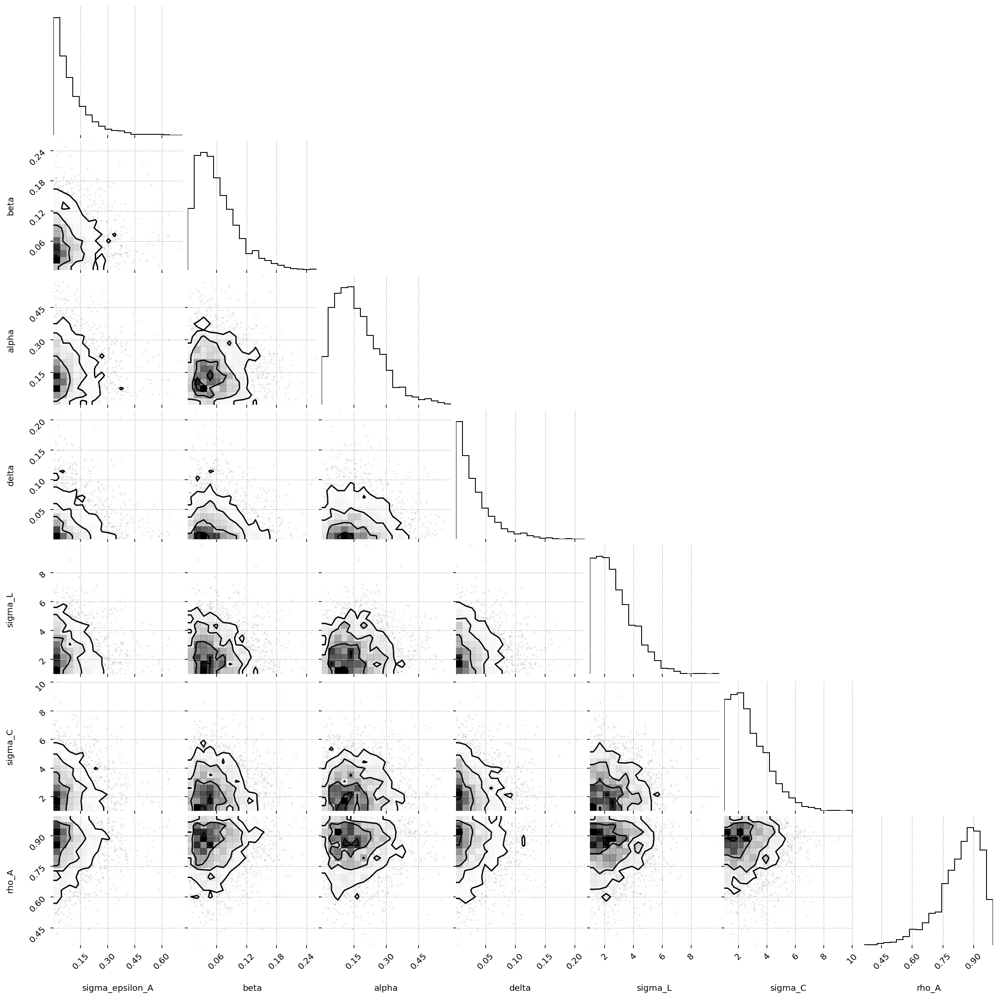

In [18]:
fig = corner(
    priors,
    group="prior",
    figure_kwargs={"figsize": (8, 8), "dpi": 144, "layout": "constrained"},
);

Since priors were defined in the GCN file, we can load those priors using `ss_mod.to_pymc()`. You will still need to manually define priors for those which were not included. In this case, we need to manually give a prior to `sigma_epsilon_A`.

In [19]:
# Save this for plotting later
prior_dict = ss_mod.param_priors.copy()

with pm.Model(coords=ss_mod.coords) as pm_mod:
    ss_mod.to_pymc()

    # Save sigma_epsilon_A in preliz format so we can compare it against the posteriors later
    prior_dict["sigma_epsilon_A"] = pz.maxent(
        pz.Gamma(), lower=0.01, upper=0.05, plot=False
    )
    prior_dict["sigma_epsilon_A"].to_pymc("sigma_epsilon_A")

    prior = pm.sample_prior_predictive(2000, random_seed=rng)

Sampling: [alpha, beta, delta, rho_A, sigma_C, sigma_L, sigma_epsilon_A]


In [20]:
# In case we want everything, not just the deep_params
all_params = list(prior_dict.keys())

In [21]:
az.summary(prior.prior)

arviz - WARNING - Shape validation failed: input_shape: (1, 2000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
sigma_epsilon_A,0.029,0.011,0.010,0.049,0.000,0.000,1975.0,1820.0,NaN
beta,0.945,0.026,0.897,0.988,0.001,0.000,2063.0,1815.0,NaN
alpha,0.288,0.159,0.024,0.573,0.004,0.003,1904.0,1979.0,NaN
delta,0.046,0.031,0.001,0.103,0.001,0.001,1764.0,1593.0,NaN
sigma_L,2.332,0.879,0.873,3.952,0.020,0.014,1915.0,1776.0,NaN
sigma_C,2.343,0.878,0.906,3.983,0.020,0.014,1895.0,1626.0,NaN
rho_A,0.950,0.039,0.877,1.000,0.001,0.001,2100.0,2045.0,NaN


## Generating artifical data and prior predictive checking

Either way, once we're happy, we can call `ss_mod.build_statespace_graph`, passing in observed data. In this case we don't have observed data, so we will need to generate some from the priors. A helper function, `data_from_priors`, is available to help you do that.

This prior predictive workflow is also useful for checking model calibration and identification. If you cannot recover "true" parameter values when data are actually generated by the model, you either have a model error, or you need to go back to the drawing board. 

In [22]:
true_params, data, prior_idata = data_from_prior(ss_mod, pm_mod, random_seed=rng)
true_param_dict = {param: true_params[param].item() for param in all_params}

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, beta, delta, obs, rho_A, sigma_C, sigma_L, sigma_epsilon_A]
Sampling: [prior_combined]


Output()

`data_from_prior` returns many parameter draws from the prior, along with model trajectories generated using those parameter draws. It also selects a single draw and splits off 1) a trajectory over observed data for that draw (that is, data with measurement error, if any), and the parameter values that were used to generate that data. 

Here is the trajectory over log deviation from steady-state GDP that was generated by the priors

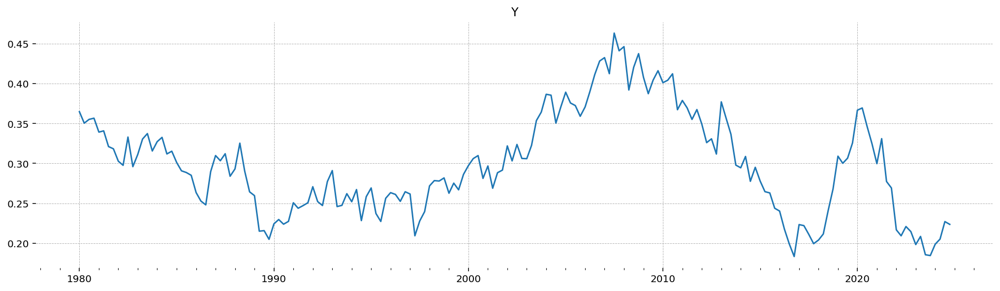

In [23]:
gp.plot_timeseries(data);

And we can also check the parameter values that generated that draw. We also get back a couple diagonostic values, including:

- `ss_resid`: The residual of the steady-state at the parameter draw
- `deterministic_norm`: The norm assoicated with inaccuracies in the deterministic part of the statespace
- `stochastic_norm`: The norm associated with inaccuracies in the stochastic part of the statespace
- `n_cycle_steps`: How many steps of cycle reduction were necessary to compute the policy function
- `param_idx`: The index associated with the draw chosen for the fake data.

In [24]:
true_params

<xarray.Dataset> Size: 120B
Dimensions:             ()
Coordinates:
    chain               int64 8B 0
    draw                int64 8B 449
Data variables: (12/13)
    sigma_epsilon_A     float64 8B 0.02862
    deterministic_norm  float64 8B 1.398e-15
    beta                float64 8B 0.9486
    alpha               float64 8B 0.05989
    stochastic_norm     float64 8B 2.486e-16
    n_cycle_steps       int64 8B 13
    ...                  ...
    sigma_L             float64 8B 1.842
    sigma_C             float64 8B 2.285
    rho_A               float64 8B 0.9962
    ss_resid            float64 8B 2.342e-31
    policy_resid        float64 8B 1.956e-30
    param_idx           int64 8B 449
Attributes:
    created_at:                 2025-03-04T05:09:43.728217+00:00
    arviz_version:              0.20.0
    inference_library:          pymc
    inference_library_version:  5.21.0

Since we know the draw, we can also go in and check the "true" latent states (the model states that are not observed), and see how well we do at recovering those after estimation.

In [25]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(
        chain=0, draw=true_params.param_idx
    )
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

Note that since there is no measurement error in this model, the latent Y and the observed Y will be identical.

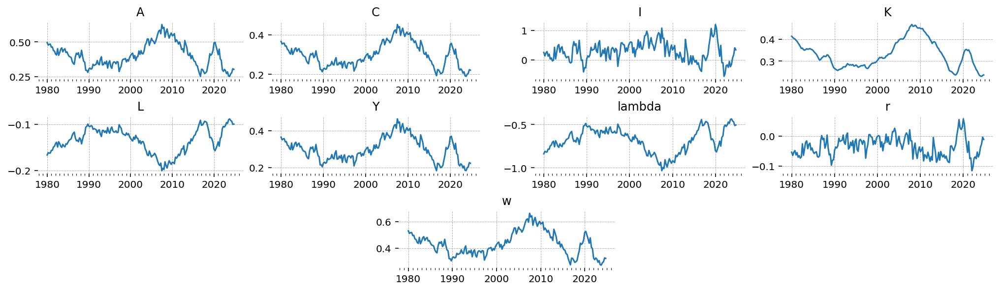

In [26]:
gp.plot_timeseries(latent_data);

# Estimating the model 

To actually estimate the model, the first thing we have to do is to call `ss_mod.build_statespace_graph` inside the PyMC model context. This method has several options related to penalty terms we can add to the loglikelihood. It is recommended to add all of these, as they bias the model away from parameter values that don't result in a steady state solution, or that don't satisfy Blanchard-Kahn conditions.

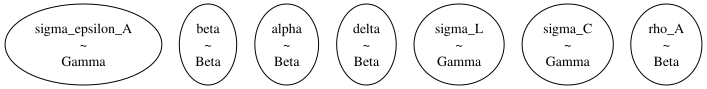

In [27]:
pm_mod.to_graphviz()

In [28]:
with pm_mod:
    ss_mod.build_statespace_graph(
        data,
        add_norm_check=True,
        add_solver_success_check=True,
        add_steady_state_penalty=True,
    )

As you can see, a Kalman filter was set up for us, along with three penalty terms that will be added to the logp. These penalty terms should help with stability during fitting!

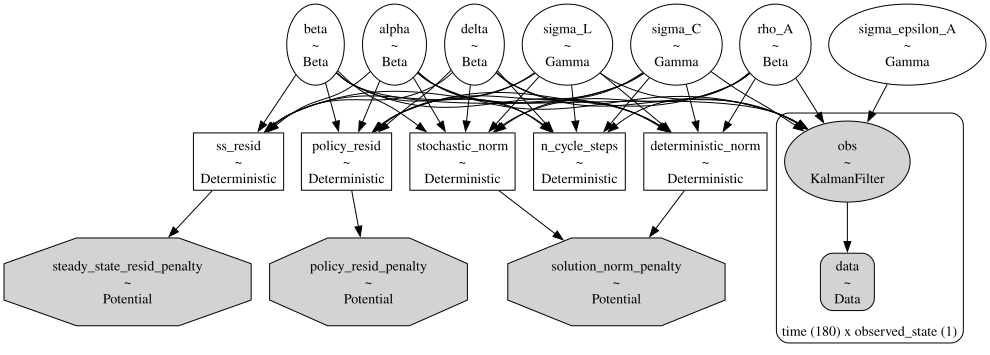

In [29]:
pm_mod.to_graphviz()

## Laplace Approximation

To actually fit the model, many algorithms are available. `gEconpy` uses `pytensor` to construct a fully differentiable computational graph, allowing access to gradients and even hessians of any scalar loss function you like. Typically, however, we just work with the log probability of the data under the model.

The simplest way thing to do is to directly minimize the logp. In the Bayesian literature, this is called Maximum a Posteriori (MAP) estimation. It can be combined with a Laplace (or Quadratic) approximation to obtain posterior distributions. Using this method, the inverse Hessian of the logp is used as a covariance matrix, and the posterior is approximated as a Multivariate normal distribution.

To do MAP estimation, use `pymc_extras.fit_laplace`

In [30]:
from pymc_extras import fit_laplace

with pm_mod:
    idata_laplace = fit_laplace(
        optimize_method="trust-ncg",
        gradient_backend="jax",
        compile_kwargs={"mode": "JAX"},
        optimizer_kwargs={"tol": 1e-12},
    )

Output()

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/arviz/data/inference_data.py:1546: UserWarning: The group fit is not defined in the InferenceData scheme
  warnings.warn(


Output()

In [31]:
deep_params = ss_mod.param_names
az.summary(idata_laplace, var_names=deep_params)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
alpha,0.160,0.141,-0.099,0.432,0.005,0.003,898.0,1017.0,1.0
beta,0.960,0.023,0.917,1.001,0.001,0.001,957.0,775.0,1.0
delta,0.022,0.023,-0.022,0.061,0.001,0.001,950.0,936.0,1.0
rho_A,0.996,0.003,0.991,1.002,0.000,0.000,1044.0,986.0,1.0
sigma_C,2.109,0.745,0.751,3.504,0.023,0.016,1096.0,923.0,1.0
sigma_L,1.921,0.824,0.372,3.466,0.026,0.018,993.0,987.0,1.0
sigma_epsilon_A,0.025,0.004,0.018,0.034,0.000,0.000,1102.0,917.0,1.0


The laplace approximation is very fast as does a reasonable job. The downside is that it is a normal approximation, so it doesn't respect the domain of the prior distributions. For example, we can see that there is some probability mass on negative alpha and delta, even though we ruled that out with Beta distributions.

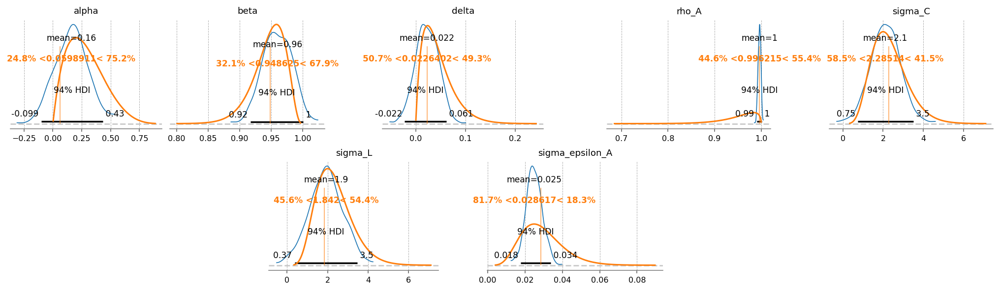

In [32]:
gp.plot_posterior_with_prior(
    idata=idata_laplace,
    true_values=true_params,
    prior_dict=prior_dict,
    var_names=deep_params,
    fig_kwargs={"figsize": (14, 4), "dpi": 144},
    plot_posterior_kwargs={"textsize": 8},
);

## MCMC 

Another option is to approximate the posterior using Markov Chain Monte Carlo. MCMC is a family of algorithms, so its useful to know a bit about the popular ones.

### Metropolis-Hastings

The "traditional" MCMC method is metropolis-hastings. This is what Dynare uses. It's a very simple, gradient free algorithm. We can use this as well in PyMC by specifiying `step=pm.Metropolis()`

We also have to specify that we want to use JAX mode via the `compile_kwargs` argument, and that we want to sample all the variables at once in a single step using `blocked=True`. Finally, JAX will deadlock if we use multiple threads to sample, which is what PyMC does by default. That's why we also set `mp_ctx="forkserver"`, which will use a form a parallelism more agreeable to JAX.

In [33]:
with pm_mod:
    idata_mh = pm.sample(
        step=pm.Metropolis(compile_kwargs={"mode": "JAX"}, blocked=True),
        cores=4,
        chains=4,
        compile_kwargs={"mode": "JAX"},
        mp_ctx="forkserver",
        random_seed=rng,
    )

Multiprocess sampling (4 chains in 4 jobs)
Metropolis: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A]


Output()

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/tensor/slinalg.py:506: 
LinAlgWarning: Ill-conditioned matrix (rcond=1.4154e-21): result may not be accurate.
  outputs[0][0] = scipy_linalg.solve(

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/tensor/slinalg.py:506: 
LinAlgWarning: Ill-conditioned matrix (rcond=1.41539e-21): result may not be accurate.
  outputs[0][0] = scipy_linalg.solve(

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/tensor/slinalg.py:506: 
LinAlgWarning: Ill-conditioned matrix (rcond=1.00087e-17): result may not be accurate.
  outputs[0][0] = scipy_linalg.solve(

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/tensor/slinalg.py:506: 
LinAlgWarning: Ill-conditioned matrix (rcond=1.00086e-17): result may not be accurate.
  outputs[0][0] = scipy_linalg.solve(

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 47 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


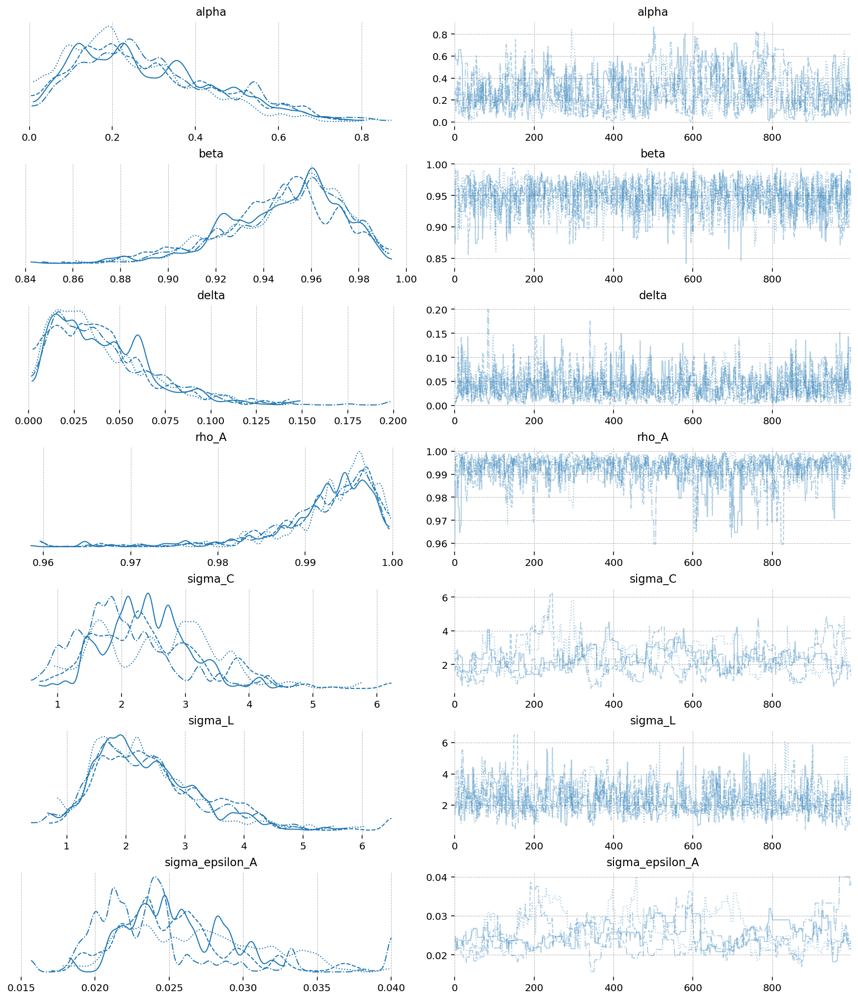

In [34]:
az.plot_trace(idata_mh, var_names=deep_params);

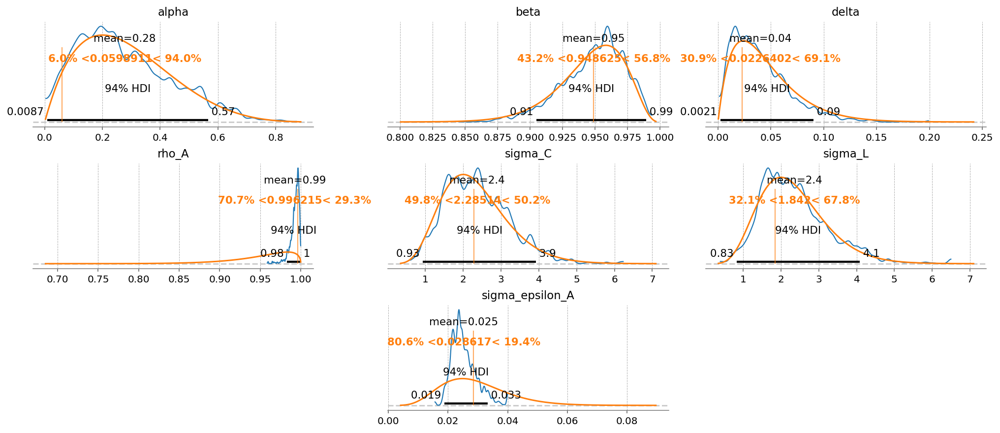

In [35]:
gp.plot_posterior_with_prior(
    idata_mh,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

### NUTS

A much better choice is NUTS, which is a state-of-the-art implementation of Hamiltonian Monte-Carlo. The best implementation is in `nutpie`. This too can be accessed through PyMC. Like above, we want to set all of the compile backend options to JAX, because it's faster.

In [36]:
with pm_mod:
    idata_nuts = pm.sample(
        nuts_sampler="nutpie",
        nuts_sampler_kwargs={"backend": "jax", "gradient_backend": "jax"},
        cores=4,
        chains=4,
        target_accept=0.95,
        random_seed=rng,
    )

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,27,0.31,15
,2000,23,0.28,15
,2000,24,0.30,15
,2000,25,0.26,15


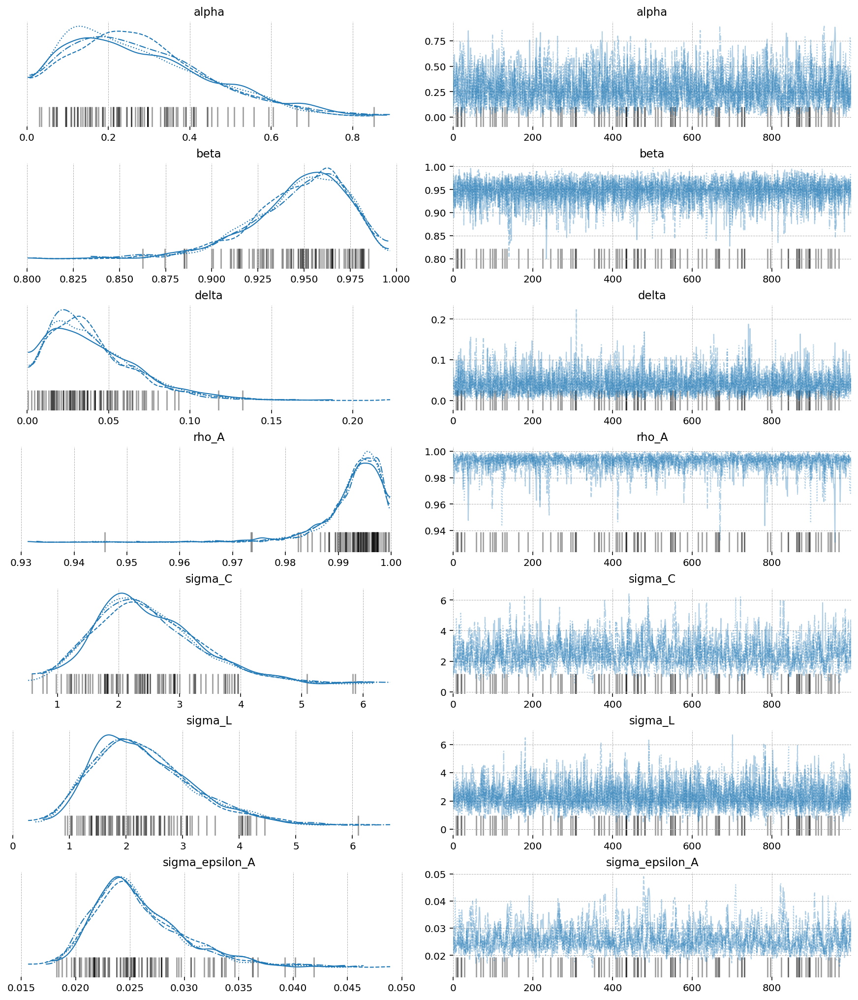

In [37]:
az.plot_trace(idata_nuts, var_names=deep_params);

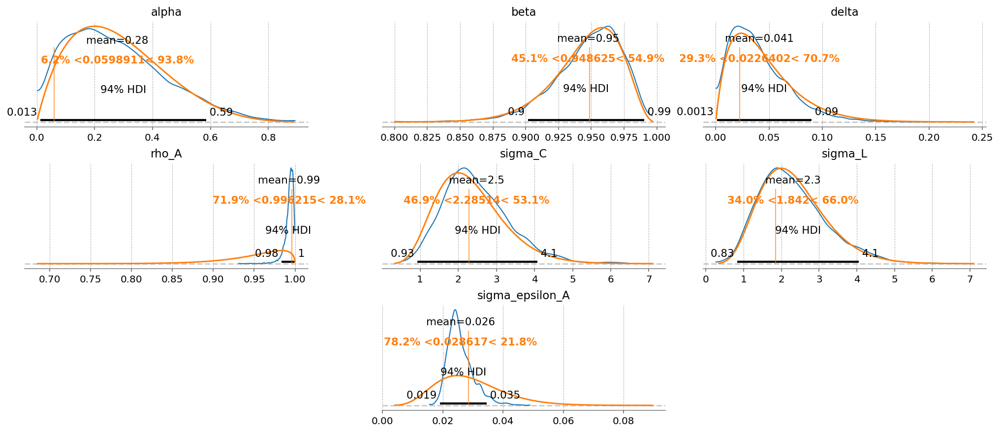

In [38]:
gp.plot_posterior_with_prior(
    idata_nuts,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

Aside from getting much nicer looking posteriors, we also get many many more effective samples using NUTS. This is why it is strongly preferred over MH. Sampling 4000 draws with MH resulted in between 150 - 2000 effective draws (bulk + tail), while sampling with NUTS result in 2000-5000! The r_hat statistic also indicates much better mixing with NUTS, suggesting all the chains independently converged to the true posterior.

Notice that there were several in NUTS, which suggests there might be some areas of ugly posterior geometry that we were unable to sample. This is expected, because DSGE models have so many numerical hoops that need to be jumped through for a successful fit: steady state, linearization, blanchard-khan conditions, and finding the optimal policy function. The sampler can't see all of this, so it's a miracle we get samples at all.

We can see the problems are likely caused by the very persistant shock estimate. The posterior mass for the $rho_A$ parameter is almost all concentrated between 0.98 and 1 (the true sampled parameter was 0.99). This makes numerical stability a bit more precarious as we go through the process of sample -> linearize -> solve.

We can try to reduce divergences by increasing the `target_accept` parameter, which I've already set to 0.95, up from the default of 0.8. This makes the samper take smaller, more cautious steps. The idea is that this will allow it to up right up to the regions of discontinunity, and explore as much as possible.

Conventional bayesian folklore is that the only correct number of divergences is 0, but in my testing, results look pretty dang good even though we hit a few.

In [39]:
import pandas as pd

mh_stats = az.summary(idata_mh, var_names=deep_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="Metropolis-Hastings")
nuts_stats = az.summary(idata_nuts, var_names=deep_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="NUTS")
pd.concat([mh_stats, nuts_stats]).reset_index().set_index(["index", "model"]).unstack(
    "model"
)

ess_bulk                    ess_tail          \
model           Metropolis-Hastings    NUTS Metropolis-Hastings    NUTS   
index                                                                     
alpha                         177.0  1993.0               351.0  2209.0   
beta                          780.0  5196.0               988.0  2364.0   
delta                         712.0  3925.0               767.0  1929.0   
rho_A                         379.0  1587.0               426.0  1526.0   
sigma_C                        32.0  1156.0               157.0  1632.0   
sigma_L                       386.0  3859.0               705.0  2535.0   
sigma_epsilon_A                26.0  1068.0               136.0  1372.0   

                              r_hat       
model           Metropolis-Hastings NUTS  
index                                     
alpha                          1.02  1.0  
beta                           1.00  1.0  
delta                          1.00  1.0  
rho_A                          1.01  1.0  
sigma_C                        1.10  1.0  
sigma_L                        1.01  1.0  
sigma_epsilon_A                1.11  1.0

# Comparing Results

We can compare the estimated posteriors between the three methods. On this simple RBC, they don't disagree so much. Laplace is fast, but the posterior doesn't respect the economic constraints imposed on the problem (we have alpha and delta less than 0, for example!). NUTS should be considered the "ground truth" because of its ability to completely explore the posterior space. 

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

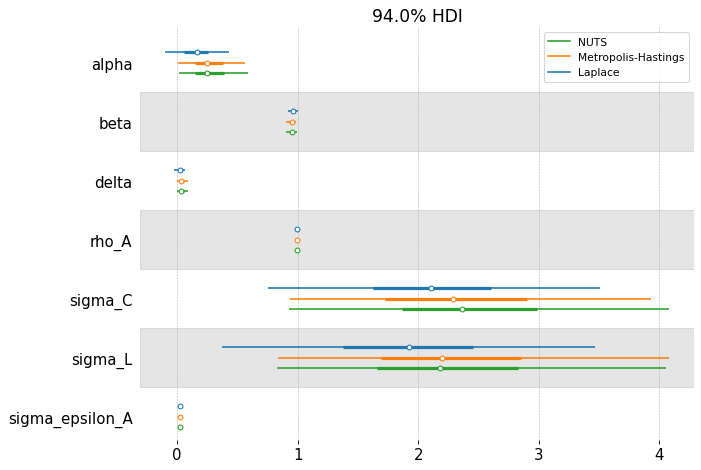

In [40]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=77)
az.plot_forest(
    [idata_laplace, idata_mh, idata_nuts],
    combined=True,
    var_names=deep_params,
    model_names=["Laplace", "Metropolis-Hastings", "NUTS"],
    ax=ax,
)

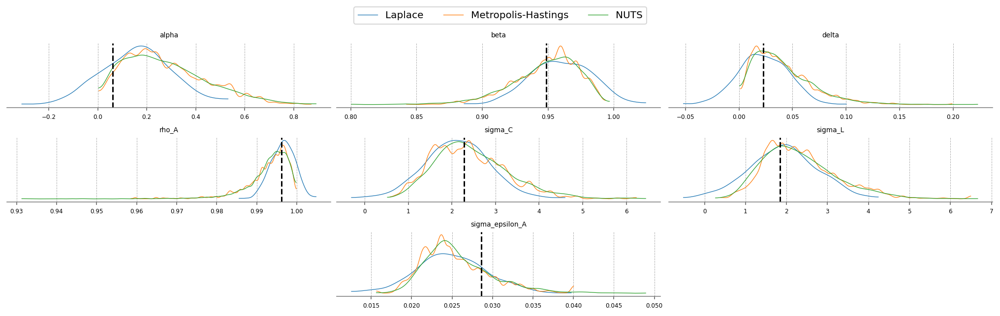

In [41]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(deep_params), figure=fig)
[fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["tab10"]

idatas = [idata_laplace, idata_mh, idata_nuts]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names)):
    axes = az.plot_posterior(
        idata,
        var_names=deep_params,
        hdi_prob="hide",
        point_estimate=None,
        c=cmap[i],
        ax=fig.axes,
        textsize=6,
    )
    axes[0].get_lines()[-1].set_label(sampler)

    if i < 2:
        continue
    for axis in axes:
        axis.axvline(true_param_dict[axis.get_title()], ls="--", color="k")


fig.legend(ncols=3, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

## Post-Estimation 

Once we have a trace object, we can sample conditional and unconditional trajectories from the posterior

In [42]:
conditional_posterior = ss_mod.sample_conditional_posterior(idata_nuts, random_seed=rng)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x372436CE0>), RNG(<Generator(PCG64) at 0x372436A40>), RNG(<Generator(PCG64) at 0x372436DC0>), RNG(<Generator(PCG64) at 0x372436180>), RNG(<Generator(PCG64) at 0x372436260>), RNG(<Generator(PCG64) at 0x3275CBBC0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

The estimation procedure does a good job recovering latent states in most cases. We noiselessly recover Y, since that was included as observed without measurement error. Our estimate of the TFP process is biased downward, but we capture the dynamics correctly, and the true process is within the 94% HDI. All other states look pretty good!


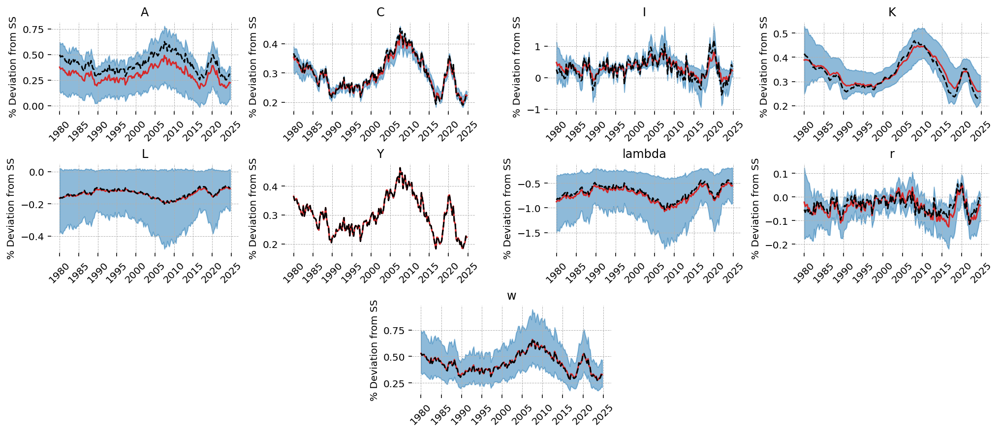

In [43]:
fig = gp.plot_kalman_filter(
    conditional_posterior,
    latent_data,
    kalman_output="smoothed",
);

We can also compute impulse response functions. Since there's only one shock, we pass an array with one element. We will look at a 10% shock to TFP

In [44]:
irf = ss_mod.impulse_response_function(
    idata_nuts, n_steps=20, shock_size=np.array([0.1]), random_seed=rng
)

Sampling: []


Output()

We can see that TFP is extremely persistant; this is consistent with the posterior estimate of $rho_A$. As a result, we see "sticky" results in the other variables, with no re-convergence to the steady-state within the 20 periods we plot.

We also get 94% HDIs around the IRFs, "for free"

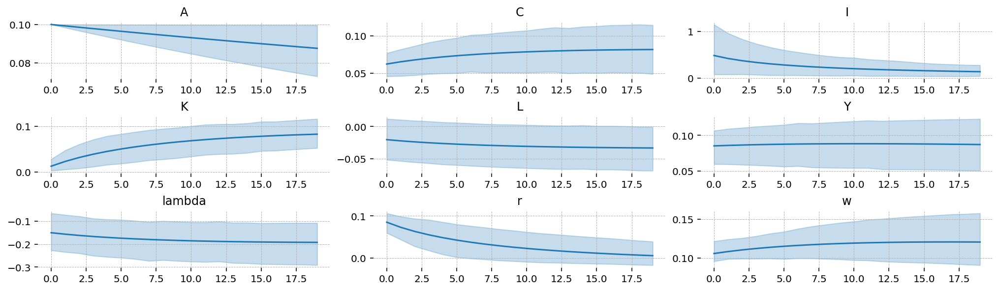

In [45]:
irf_mu = irf.mean(dim=["chain", "draw"]).irf
irf_hdi = az.hdi(irf).irf
x_grid = irf.irf["time"].values

vars_to_plot = ss_mod.state_names
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(vars_to_plot), figure=fig)

for var, loc in zip(vars_to_plot, locs):
    axis = fig.add_subplot(gs[loc])
    axis.plot(x_grid, irf_mu.sel(state=var))
    axis.fill_between(
        x_grid, *irf_hdi.sel(state=var).values.T, color="tab:blue", alpha=0.25
    )
    axis.set_title(var)


plt.show()

# Adding more observed states

It is possible to add additional information to the estimation if we include measurement error on the observed data. We can only have as many observed states as we have sources of stochastic variation in the model; this is a condition required to identify the residual covariance matrix during Kalman filtering. Having fewer sources of stochastic variation than observed states is called **stochastic singularity**. gEconpy will refuse to estimate models that have a stochastic singularity.

This RBC model only has one source of variation, the innovations on the TFP process, `epsilon_A`. But measurement error also counts! So we can show the model $C, I, L, Y, r, w$. 

In [46]:
ss_mod.configure(
    observed_states=["Y", "C", "I", "L", "r", "w"],
    measurement_error=["Y", "C", "I", "L", "r", "w"],
    full_shock_covaraince=False,
    solver="scan_cycle_reduction",
    mode="JAX",
    use_adjoint_gradients=True,
    max_iter=20,
)

                  Model Requirements                  
                                                      
  Variable          Shape   Constraints   Dimensions  
 ──────────────────────────────────────────────────── 
  alpha             ()                          None  
  beta              ()                          None  
  delta             ()                          None  
  rho_A             ()                          None  
  sigma_C           ()      Positive            None  
  sigma_L           ()      Positive            None  
  sigma_epsilon_A   ()      Positive            None  
  error_sigma_Y     ()                          None  
  error_sigma_C     ()                          None  
  error_sigma_I     ()                          None  
  error_sigma_L     ()                          None  
  error_sigma_r     ()                          None  
  error_sigma_w     ()                          None  
                                                      
 These parameters should be assigned priors inside a  
         PyMC model block before calling the          
            build_statespace_graph method.            

In [47]:
prior_dict = ss_mod.param_priors.copy()

with pm.Model(coords=ss_mod.coords) as pm_mod:
    ss_mod.to_pymc()
    prior_dict["sigma_epsilon_A"] = pz.maxent(
        pz.Gamma(), lower=0.01, upper=0.1, plot=False
    )
    prior_dict["sigma_epsilon_A"].to_pymc("sigma_epsilon_A")

    for state in ["Y", "C", "I", "L", "r", "w"]:
        prior_dict[f"error_sigma_{state}"] = pz.maxent(
            pz.Gamma(), lower=0.01, upper=0.1, plot=False
        )
        prior_dict[f"error_sigma_{state}"].to_pymc(f"error_sigma_{state}")

In [48]:
error_params = [x for x in prior_dict if x.startswith("error")]

In [49]:
true_params, data, prior_idata = data_from_prior(ss_mod, pm_mod, random_seed=rng)
true_param_dict = {param: true_params[param].item() for param in deep_params}

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc_extras/statespace/utils/data_tools.py:159: ImputationWarning: Provided data contains missing values and will be automatically imputed as hidden states during Kalman filtering.
  warnings.warn(impute_message, ImputationWarning)
Sampling: [alpha, beta, delta, error_sigma_C, error_sigma_I, error_sigma_L, error_sigma_Y, error_sigma_r, error_sigma_w, obs, rho_A, sigma_C, sigma_L, sigma_epsilon_A]
Sampling: [prior_combined]


Output()

In [50]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(
        chain=0, draw=true_params.param_idx
    )
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

We can see now that the observed states (in red) are noisy compared to the underlying true states (blue). $A$, $K$, and $\lambda$ are not observed, so they have no noisy red counterpart

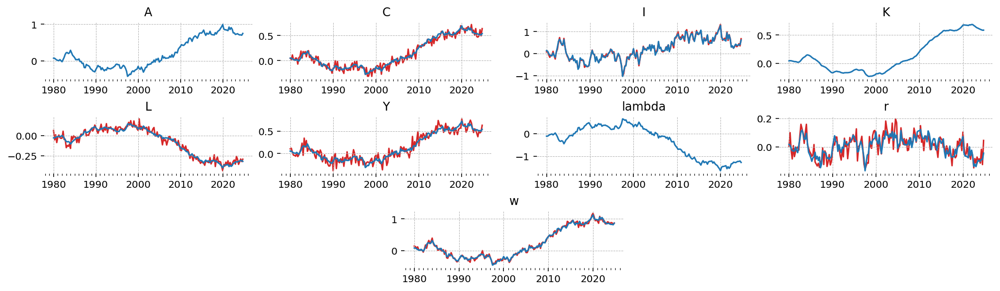

In [51]:
fig = gp.plot_timeseries(latent_data)
for axis in fig.axes:
    state = axis.get_title()
    if state in data:
        axis.plot(data.index, data[state], color="tab:red", zorder=-1)

## Laplace Approximation

In [52]:
with pm_mod:
    ss_mod.build_statespace_graph(
        data,
        add_norm_check=True,
        add_solver_success_check=True,
        add_steady_state_penalty=True,
    )
    idata_laplace_2 = fit_laplace(
        optimize_method="trust-ncg",
        gradient_backend="jax",
        compile_kwargs={"mode": "JAX"},
        optimizer_kwargs={"tol": 1e-12},
    )

Output()

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/arviz/data/inference_data.py:1546: UserWarning: The group fit is not defined in the InferenceData scheme
  warnings.warn(


Output()

What's nice about including more variables, even with measurement error, is that we now have more information about the deep parameters, allowing for their identification. In the first example, we got back the priors for everything except $\rho_A$ and $\sigma_{\varepsilon_A}$, whereas we now get accurate estimates for $\alpha$, $\delta$, $\sigma_C$ and $\sigma_L$.

One nice thing about the Bayesian framework is that when a deep parameter is not identified, we just get back the prior. Basically there's never any cost to *not* putting a prior on a parameter. Setting a value to fixed essentially means putting a Dirac prior on it that rejects any other possible value, which is a priori silly -- we don't have that level of confidence on any of these. 

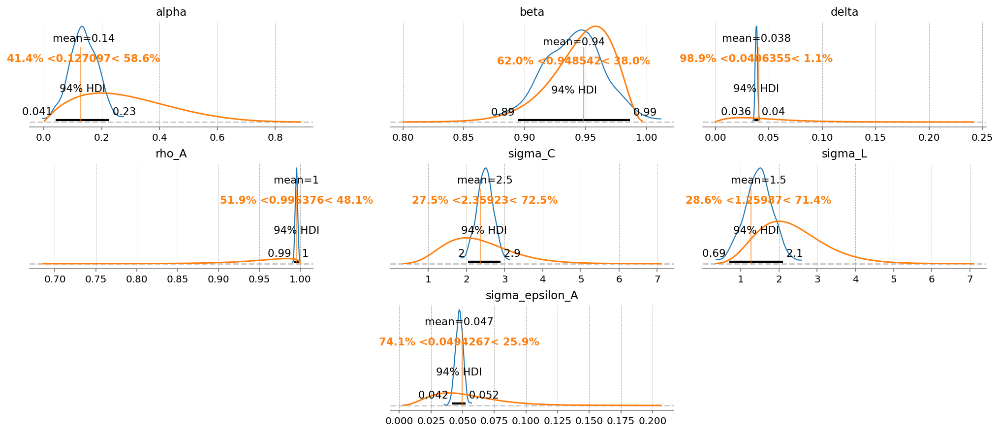

In [53]:
gp.plot_posterior_with_prior(
    idata_laplace_2,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
);

## Metropolis-Hastings

In [54]:
with pm_mod:
    idata_mh_2 = pm.sample(
        step=pm.Metropolis(compile_kwargs={"mode": "JAX"}, blocked=True),
        cores=4,
        chains=4,
        compile_kwargs={"mode": "JAX"},
        mp_ctx="forkserver",
        random_seed=rng,
    )

Multiprocess sampling (4 chains in 4 jobs)
Metropolis: [beta, delta, sigma_C, sigma_L, alpha, rho_A, sigma_epsilon_A, error_sigma_Y, error_sigma_C, error_sigma_I, error_sigma_L, error_sigma_r, error_sigma_w]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 178 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


In the model with only one observed state, MH did a passable job. Now, with this somewhat more complex model, it's utterly hopeless. We can see that the chains are extremely autocorrelated. Assuming they entered the typical set during tuning, they certaintly aren't exploring it effectively!

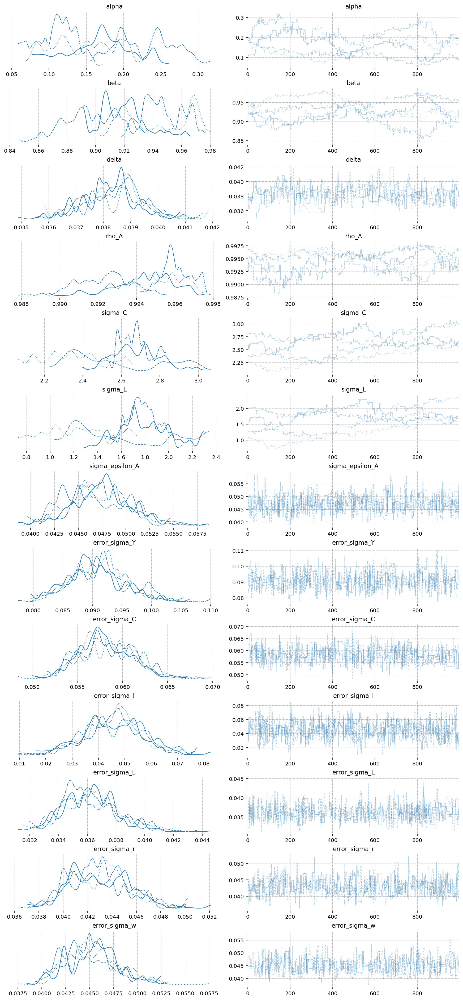

In [55]:
az.plot_trace(idata_mh_2, var_names=deep_params + error_params);

## NUTS

In [56]:
with pm_mod:
    idata_nuts_2 = pm.sample(
        nuts_sampler="nutpie",
        nuts_sampler_kwargs={"backend": "jax", "gradient_backend": "jax"},
        cores=4,
        chains=4,
        target_accept=0.95,
        random_seed=rng,
    )

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(


Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,37,0.16,31
,2000,33,0.15,31
,2000,43,0.17,31
,2000,35,0.17,63


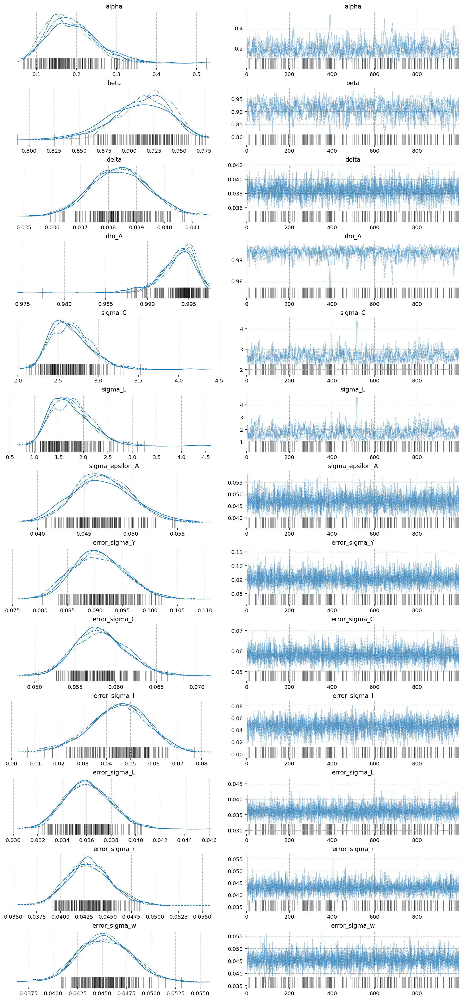

In [57]:
az.plot_trace(idata_nuts_2, var_names=deep_params + error_params);

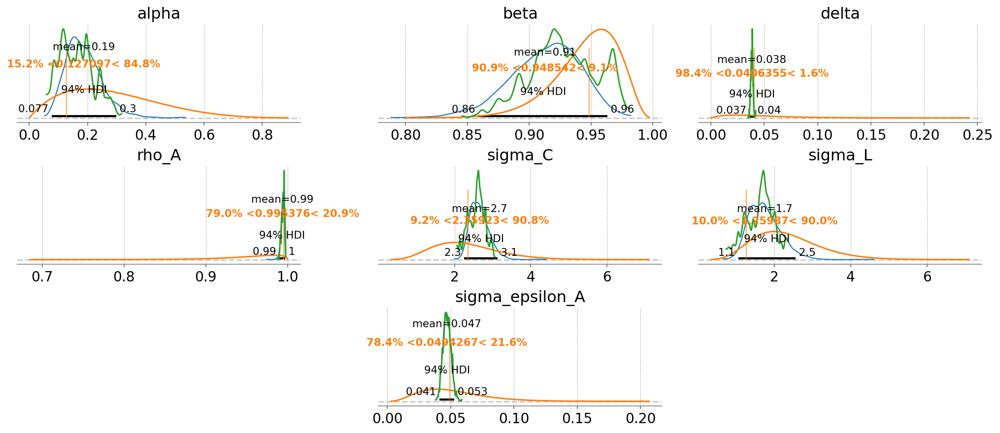

In [58]:
fig = gp.plot_posterior_with_prior(
    idata_nuts_2,
    var_names=deep_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
)
az.plot_posterior(
    idata_mh_2,
    var_names=deep_params,
    ax=fig.axes,
    point_estimate=None,
    c="tab:green",
    hdi_prob="hide",
)
plt.show()

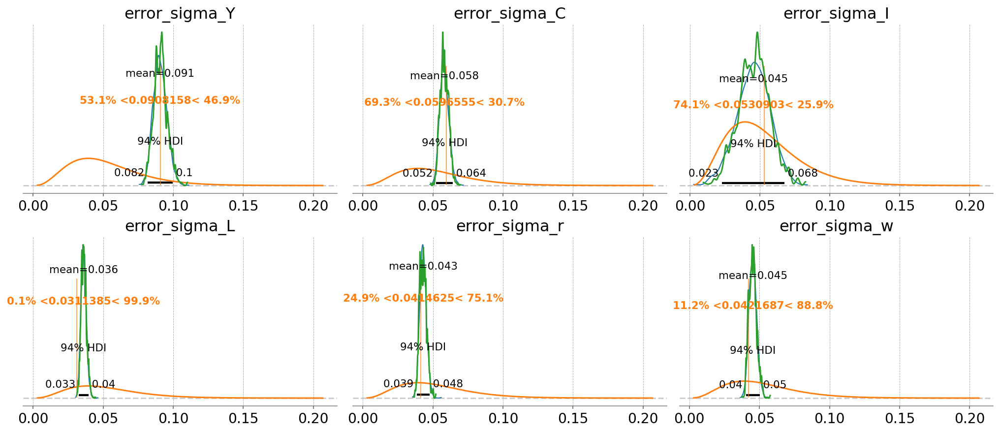

In [59]:
fig = gp.plot_posterior_with_prior(
    idata_nuts_2,
    var_names=error_params,
    prior_dict=prior_dict,
    true_values=true_params,
    n_cols=3,
)
az.plot_posterior(
    idata_mh_2,
    var_names=error_params,
    ax=fig.axes,
    point_estimate=None,
    c="tab:green",
    hdi_prob="hide",
);

array([<Axes: title={'center': '94.0% HDI'}>], dtype=object)

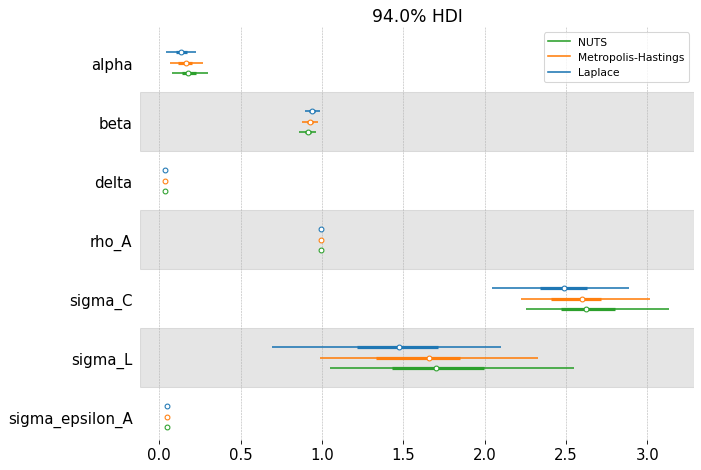

In [60]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=77)
az.plot_forest(
    [idata_laplace_2, idata_mh_2, idata_nuts_2],
    combined=True,
    var_names=deep_params,
    model_names=["Laplace", "Metropolis-Hastings", "NUTS"],
    ax=ax,
)

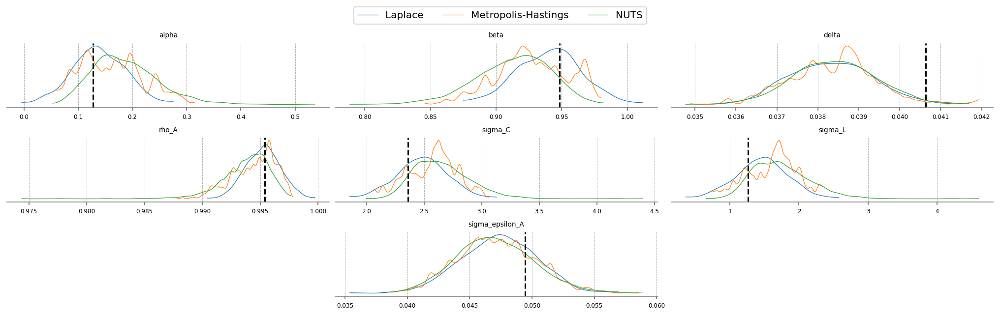

In [61]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=3, n_plots=len(deep_params), figure=fig)
[fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["tab10"]

idatas = [idata_laplace_2, idata_mh_2, idata_nuts_2]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names)):
    axes = az.plot_posterior(
        idata,
        var_names=deep_params,
        hdi_prob="hide",
        point_estimate=None,
        c=cmap[i],
        ax=fig.axes,
        textsize=6,
    )
    axes[0].get_lines()[-1].set_label(sampler)

    if i < 2:
        continue
    for axis in axes:
        axis.axvline(true_param_dict[axis.get_title()], ls="--", color="k")


fig.legend(ncols=3, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

In [62]:
mh_stats = az.summary(idata_mh_2, var_names=deep_params + error_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="Metropolis-Hastings")
nuts_stats = az.summary(idata_nuts_2, var_names=deep_params + error_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="NUTS")
pd.concat([mh_stats, nuts_stats]).reset_index().set_index(["index", "model"]).unstack(
    "model"
)

ess_bulk                    ess_tail          \
model           Metropolis-Hastings    NUTS Metropolis-Hastings    NUTS   
index                                                                     
alpha                           6.0   632.0                23.0   762.0   
beta                            6.0   654.0                16.0   922.0   
delta                         174.0  3063.0               259.0  2944.0   
error_sigma_C                 412.0  6912.0               384.0  2964.0   
error_sigma_I                 416.0  2652.0               573.0  1417.0   
error_sigma_L                 515.0  6760.0               449.0  2954.0   
error_sigma_Y                 412.0  6538.0               368.0  2942.0   
error_sigma_r                 403.0  6141.0               344.0  2673.0   
error_sigma_w                 429.0  5606.0               412.0  2746.0   
rho_A                           6.0   658.0                26.0   752.0   
sigma_C                         6.0   651.0                13.0  1044.0   
sigma_L                         6.0   648.0                14.0  1045.0   
sigma_epsilon_A               297.0  3325.0               389.0  2318.0   

                              r_hat        
model           Metropolis-Hastings  NUTS  
index                                      
alpha                          1.87  1.01  
beta                           2.03  1.01  
delta                          1.03  1.00  
error_sigma_C                  1.01  1.00  
error_sigma_I                  1.01  1.00  
error_sigma_L                  1.01  1.00  
error_sigma_Y                  1.01  1.00  
error_sigma_r                  1.01  1.00  
error_sigma_w                  1.01  1.00  
rho_A                          1.75  1.01  
sigma_C                        1.89  1.00  
sigma_L                        1.92  1.00  
sigma_epsilon_A                1.03  1.00

## Bonus: NUTS with Normalizing Flows (Fisher HMC)

NUTS is a very good sampler, but as we've seen, it can struggle when faced with awkward posterior geometries, such as ours. A brand new, highly experimental method of dealing with this involves combining normalizing flows with NUTS. 

The idea is simple: since our posterior geometry sucks, let's just go get a better one!

Specifically, we're going to sample using NUTS for a bit, then stop and take a look at what we've obtained. We use a neural network to learn to transform these samples in a way that make them look as much like draws from iid gaussians as possible. The transformation we learn is special for two reasons:

1. It's bijective, so we can go from our "true" space to the iid space, or from the iid space back to the true space, and;
2. We know what the determinant of the jacobian that describes this transformtion is. This means we can track how the transformation distorts areas and take that distortion into account. 

Point 2 matters a lot, because we want to sample from the nice iid space, then convert the draws back to the true posterior space. This is a [change of variables](https://en.wikipedia.org/wiki/Probability_density_function#Function_of_random_variables_and_change_of_variables_in_the_probability_density_function), so we have to account for that distortion of space. Luckily we can, so we can do MCMC in this better space, then transform back to the true posterior space!

This functionality is new and still experimental, so we need to directly import nutpie and set it up ourselves. It's also a bit fussy, with lots of hyperparameters to choose. We're dealing with neural networks, afterall. But the defaults work pretty well, so that's what we'll use.

In [63]:
import nutpie as ntp

ntp_model = ntp.compile_pymc_model(
    pm_mod, freeze_model=True, backend="jax", gradient_backend="jax"
)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(
/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pymc/pytensorf.py:952: FutureWarning: compile_pymc was renamed to compile. Old name will be removed in a future release of PyMC
  warnings.warn(


Although it takes some time to learn the transformation (that is, to train the neural network), sampling as actually faster with this method! That's because once we're done tuning, we require many many fewer gradient evaluations to obtain samples. 

Notice that divergences go down significantly (from 30-40 to 2-7), and we were able to keep the `target_accept` at the default.

One could play with the hyperparameters to get to get the divergences down to zero, but this is already a huge improvement.

In [64]:
# Set verbose = True to see some nice terminal spam about what the algorithm is doing
idata_fisher = ntp.sample(
    ntp_model.with_transform_adapt(verbose=False),
    chains=4,
    cores=4,
    draws=1000,
    tune=1000,
    # transform_adapt=True signals that we want to do normalizing flow augmented sampling
    transform_adapt=True,
)

Progress,Draws,Divergences,Step Size,Gradients/Draw
,2000,5,0.77,7
,2000,7,0.79,7
,2000,4,0.77,7
,2000,7,0.78,7


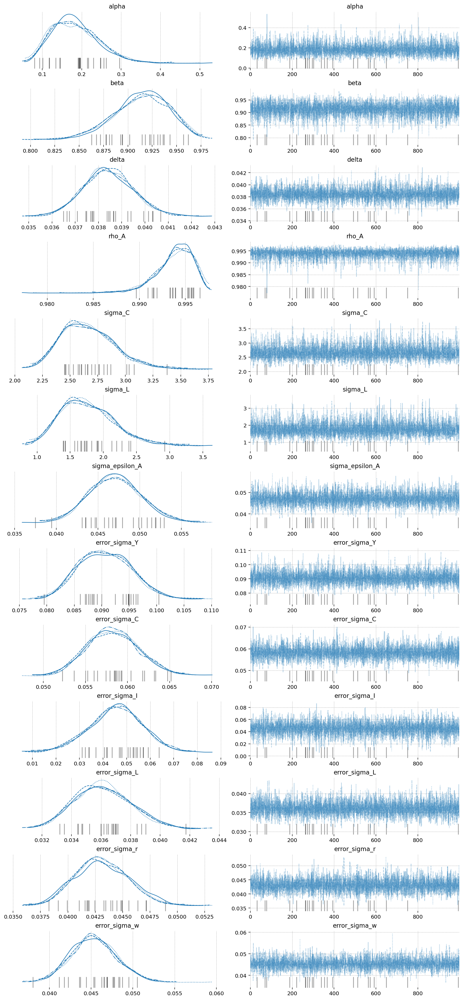

In [65]:
az.plot_trace(idata_fisher, var_names=deep_params + error_params);

The imporovement here is clear as well. Start by noticing the `r_hat` statisitic for the Fisher-NF NUTS algorithm is all 1.0, indiciating excellent mixing of the chains. MH is hopeless, and NUTS still has some small defects.

Looking at the effective samples, you can see that even the hardest to sample parameters -- $\alpha$ and $\beta$ -- get thousands of samples when using Fisher-NF, while we got only hundreds with NUTS, and only 6(!!!) with MH. 

All this, and better speed, too!

In [66]:
mh_stats = az.summary(idata_mh_2, var_names=deep_params + error_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="Metropolis-Hastings")
nuts_stats = az.summary(idata_nuts_2, var_names=deep_params + error_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="NUTS")
fisher_stats = az.summary(idata_fisher, var_names=deep_params + error_params)[
    ["ess_bulk", "ess_tail", "r_hat"]
].assign(model="Fisher-NF NUTS")

pd.concat([mh_stats, nuts_stats, fisher_stats]).reset_index().set_index(
    ["index", "model"]
).unstack("model")

ess_bulk                                   ess_tail  \
model           Fisher-NF NUTS Metropolis-Hastings    NUTS Fisher-NF NUTS   
index                                                                       
alpha                   6475.0                 6.0   632.0         3359.0   
beta                    6108.0                 6.0   654.0         3246.0   
delta                   6759.0               174.0  3063.0         2870.0   
error_sigma_C           6361.0               412.0  6912.0         2870.0   
error_sigma_I           6877.0               416.0  2652.0         3185.0   
error_sigma_L           6223.0               515.0  6760.0         2930.0   
error_sigma_Y           6511.0               412.0  6538.0         3157.0   
error_sigma_r           6341.0               403.0  6141.0         2709.0   
error_sigma_w           6741.0               429.0  5606.0         2599.0   
rho_A                   6501.0                 6.0   658.0         3157.0   
sigma_C                 5732.0                 6.0   651.0         3114.0   
sigma_L                 5749.0                 6.0   648.0         3075.0   
sigma_epsilon_A         6073.0               297.0  3325.0         2876.0   

                                                     r_hat  \
model           Metropolis-Hastings    NUTS Fisher-NF NUTS   
index                                                        
alpha                          23.0   762.0            1.0   
beta                           16.0   922.0            1.0   
delta                         259.0  2944.0            1.0   
error_sigma_C                 384.0  2964.0            1.0   
error_sigma_I                 573.0  1417.0            1.0   
error_sigma_L                 449.0  2954.0            1.0   
error_sigma_Y                 368.0  2942.0            1.0   
error_sigma_r                 344.0  2673.0            1.0   
error_sigma_w                 412.0  2746.0            1.0   
rho_A                          26.0   752.0            1.0   
sigma_C                        13.0  1044.0            1.0   
sigma_L                        14.0  1045.0            1.0   
sigma_epsilon_A               389.0  2318.0            1.0   

                                           
model           Metropolis-Hastings  NUTS  
index                                      
alpha                          1.87  1.01  
beta                           2.03  1.01  
delta                          1.03  1.00  
error_sigma_C                  1.01  1.00  
error_sigma_I                  1.01  1.00  
error_sigma_L                  1.01  1.00  
error_sigma_Y                  1.01  1.00  
error_sigma_r                  1.01  1.00  
error_sigma_w                  1.01  1.00  
rho_A                          1.75  1.01  
sigma_C                        1.89  1.00  
sigma_L                        1.92  1.00  
sigma_epsilon_A                1.03  1.00

In [67]:
fisher_post = ss_mod.sample_conditional_posterior(idata_fisher, random_seed=rng)

/Users/jessegrabowski/mambaforge/envs/geconpy-dev/lib/python3.12/site-packages/pytensor/link/jax/linker.py:27: UserWarning: The RandomType SharedVariables [RNG(<Generator(PCG64) at 0x39BF757E0>), RNG(<Generator(PCG64) at 0x39BEBF4C0>), RNG(<Generator(PCG64) at 0x39BEBF220>), RNG(<Generator(PCG64) at 0x39BEBEF80>), RNG(<Generator(PCG64) at 0x39BEBC200>), RNG(<Generator(PCG64) at 0x7390844A0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, filtered_posterior_observed, predicted_posterior, predicted_posterior_observed, smoothed_posterior, smoothed_posterior_observed]


Output()

## Hidden State Inference

We can see that the Kalman smoother does an excellent job of filtering the latent signal (black line) from the noisy observations (orange). Including extra data has helped us better identify both the deep parameters and the hidden states, even though that data was treated as noisy!  

In [68]:
latent_data = (
    prior_idata.unconditional_prior.prior_latent.sel(
        chain=0, draw=true_params.param_idx
    )
    .to_dataframe()
    .loc[:, "prior_latent"]
    .unstack("state")
)

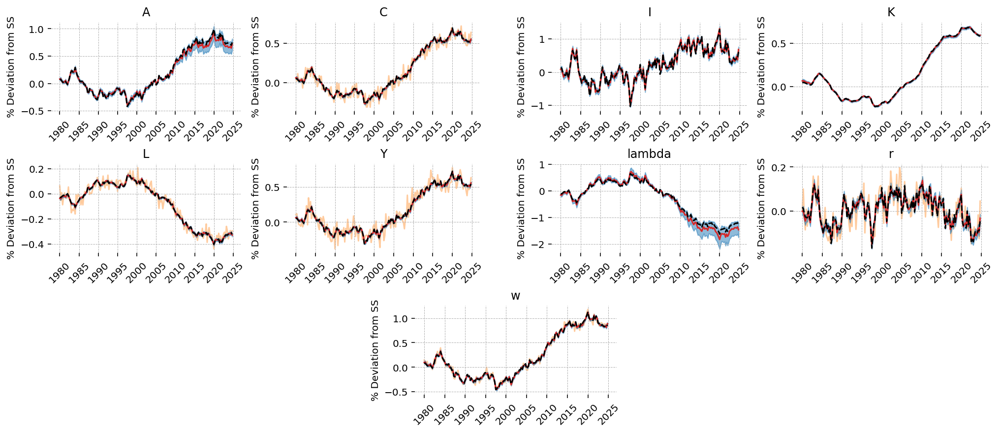

In [69]:
fig = gp.plot_kalman_filter(
    fisher_post,
    latent_data,
    kalman_output="smoothed",
)
for axis in fig.axes:
    var = axis.get_title()
    if var in data:
        axis.plot(data.index, data[var], color="tab:orange", zorder=-10, alpha=0.4)

One final comparison between all 4 sampling methods.

Note that NUTS and Fisher-NF NUTS don't look much different on these plots. This suggests that we're not systematically losing information due to NUTS not accessing part of the posterior (that is, due to the divergences). But better is still better!

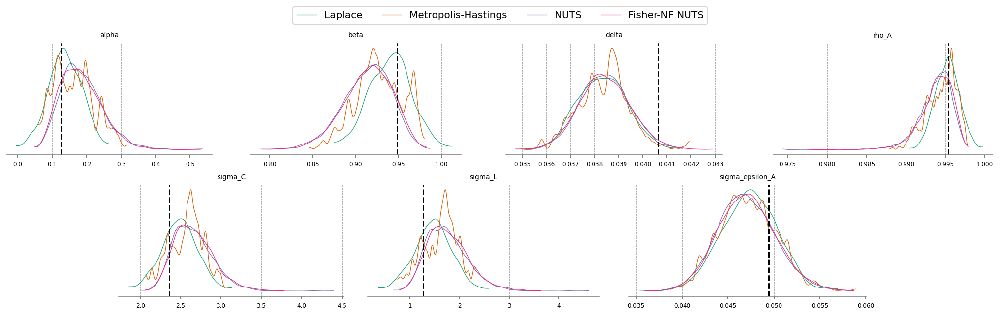

In [70]:
fig = plt.figure(figsize=(14, 4), dpi=144, layout="constrained")
gs, locs = gp.prepare_gridspec_figure(n_cols=4, n_plots=len(deep_params), figure=fig)
[fig.add_subplot(gs[loc]) for loc in locs]
cmap = plt.color_sequences["Dark2"]

idatas = [idata_laplace_2, idata_mh_2, idata_nuts_2, idata_fisher]
sampler_names = ["Laplace", "Metropolis-Hastings", "NUTS", "Fisher-NF NUTS"]

for i, (idata, sampler) in enumerate(zip(idatas, sampler_names)):
    axes = az.plot_posterior(
        idata,
        var_names=deep_params,
        hdi_prob="hide",
        point_estimate=None,
        c=cmap[i],
        ax=fig.axes,
        textsize=6,
    )
    axes[0].get_lines()[-1].set_label(sampler)

    if i < 2:
        continue
    for axis in axes:
        axis.axvline(true_param_dict[axis.get_title()], ls="--", color="k")


fig.legend(ncols=4, loc="lower center", bbox_to_anchor=(0.5, 1.0))
plt.show()

# Authors

- Authored by Jesse Grabowski in March 2025 

# Watermark

In [71]:
%load_ext watermark
%watermark -n -u -v -iv -w -p gEconpy

Last updated: Tue Mar 04 2025

Python implementation: CPython
Python version       : 3.12.9
IPython version      : 9.0.0

gEconpy: 0+untagged.305.gd931e48.dirty

corner     : 2.2.3
numpy      : 1.26.4
matplotlib : 3.10.1
pymc       : 5.21.0
gEconpy    : 0+untagged.305.gd931e48.dirty
arviz      : 0.20.0
pandas     : 2.2.3
pymc_extras: 0.2.3
preliz     : 0.15.0
nutpie     : 0.14.0

Watermark: 2.5.0

